In [0]:
!pip install scikit-plot xgboost

  Using cached scikit_plot-0.3.7-py3-none-any.whl (33 kB)
  Using cached xgboost-2.1.4-py3-none-manylinux_2_28_x86_64.whl (223.6 MB)
  Using cached nvidia_nccl_cu12-2.27.7-py3-none-manylinux2014_x86_64.manylinux_2_17_x86_64.whl (322.5 MB)
You should consider upgrading via the '/local_disk0/.ephemeral_nfs/envs/pythonEnv-8d6d059e-449f-4a4c-9b97-a3a00b4637de/bin/python -m pip install --upgrade pip' command.


In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import scikitplot as skplt
from pyspark.sql import functions as f
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, confusion_matrix, recall_score, precision_score, f1_score, ConfusionMatrixDisplay, balanced_accuracy_score, cohen_kappa_score, classification_report, mean_absolute_error, mean_squared_error, roc_curve, roc_auc_score, precision_recall_curve
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold

from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, ExtraTreesClassifier, RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.pipeline import make_pipeline

from xgboost import XGBClassifier

In [0]:
%matplotlib inline

plt.style.use( 'ggplot')
plt.rcParams['figure.figsize'] = [24, 9]
plt.rcParams['font.size'] = 24

In [0]:
def describe_num(num_attributes):
    a = num_attributes.describe().T.reset_index()
    
    d4 = pd.DataFrame(num_attributes.apply( lambda x: x.max() - x.min())).T
    d5 = pd.DataFrame(num_attributes.apply( lambda x: x.skew())).T      
    d6 = pd.DataFrame(num_attributes.apply( lambda x: x.kurtosis())).T
    d7 = pd.DataFrame(num_attributes.apply( lambda x: x.unique().shape[0])).T
    
    n = pd.concat([d4, d5, d6, d7], axis=0).T.reset_index()
    n.columns = ['attibutes', 'range', 'skew', 'kurtosis', 'unique']
    b = a.merge(n, right_on='attibutes', left_on='index')
    b.drop('index', axis=1, inplace=True)
    columns = ['attibutes', 'count', 'mean', 'std', '25%', '50%', '75%', 'min', 'max', 'range',
           'skew', 'kurtosis', 'unique']
    return b[columns]

def ml_scores(model_name, y_true, y_pred):
    
    accuracy = accuracy_score(y_true, y_pred)
    accuracy_bal = balanced_accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred)
    kappa = cohen_kappa_score(y_true, y_pred)
    
    return pd.DataFrame({'Accuracy': np.round(accuracy, 3), 
                         'Balanced Accuracy': np.round(accuracy_bal, 3), 
                         'Precision': np.round(precision, 3), 
                         'Recall': np.round(recall, 3),
                         'F1': np.round(f1, 3),
                         'Kappa': np.round(kappa, 3)}, 
                        index=[model_name])

pd.options.display.float_format = '{:.4f}'.format

def cross_validation_class(model, k, data, Verbose = True, mevo=False):
    kfold = StratifiedKFold(n_splits=k, shuffle=True, random_state=28)
    accuracy_list = []
    accuracy_bal_list = []    
    precision_list = []
    recall_list = []
    f1_list = []
    kappa_list = []

    i=1
    data = data.drop("idprescricao", axis=1)
    if mevo==True:
        score_ = data["pred"].copy()
        data = data.drop(["pred"], axis=1)
    x_ = data.drop('convertida', axis=1).copy()
    y_ = data['convertida'].copy()

    for train_cv, val_cv in kfold.split(x_, y_):        
        if Verbose == True:      
            print(f'Fold Number {i}/{k}')
        else:
            pass      
        x_train_fold = x_.iloc[train_cv]
        y_train_fold = y_.iloc[train_cv]
        x_val_fold = x_.iloc[val_cv]
        y_val_fold = y_.iloc[val_cv]
        
        if mevo==False:
            model_fit = model.fit(x_train_fold, y_train_fold)
            yhat = model_fit.predict_proba(x_val_fold)
            yhat_1 = model_fit.predict(x_val_fold)
        else:
            yhat_1 = score_.iloc[val_cv]
        
        accuracy = accuracy_score(y_val_fold, yhat_1)
        accuracy_list.append(accuracy)
        
        accuracy_bal = balanced_accuracy_score(y_val_fold, yhat_1)
        accuracy_bal_list.append(accuracy_bal)
        
        precision = precision_score(y_val_fold, yhat_1, zero_division=0)
        precision_list.append(precision)
        
        recall = recall_score(y_val_fold, yhat_1, zero_division=0)
        recall_list.append(recall)
        
        f1 = f1_score(y_val_fold, yhat_1)
        f1_list.append(f1)
        
        kappa = cohen_kappa_score(y_val_fold, yhat_1)
        kappa_list.append(kappa)

        i+=1
        
    df = pd.DataFrame({'Model Name': type(model).__name__, 
                       'Accuracy': '{} +/ - {}'.format(np.mean(accuracy_list).round(4), np.std(accuracy_list).round(4)),
                       'Balanced Accuracy': '{} +/ - {}'.format( np.mean(accuracy_bal_list).round(4), np.std(accuracy_bal_list).round(4)),
                       'Precision': '{} +/ - {}'.format(np.mean(precision_list).round(4), np.std(precision_list).round(4)),
                       'Recall': '{} +/ - {}'.format(np.mean(recall_list).round(4), np.std(recall_list).round(4)),
                       'F1': '{} +/ - {}'.format(np.mean(f1_list).round(4), np.std(f1_list).round(4)),
                       'Kappa': '{} +/ - {}'.format(np.mean(kappa_list).round(4), np.std(kappa_list).round(4)),
                       }, index = [0]
                       )

    return df

# CARREGAMENTO BASE

In [0]:
path = "default.dataset_conversao_case_ds_csv"

In [0]:
tp_int = ['convertida', 'idadepaciente', 'primeira_compra', 'hora_prescricao', 'usocontinuo', 'mip', 'controleespecial',
          'paciente_count_compras_30d', 'paciente_count_compras_90d',
          'paciente_count_exames_30d', 'paciente_count_exames_90d',
          'paciente_count_prescricoes_30d', 'paciente_count_prescricoes_90d',
          'medico_count_assinado_30d', 'medico_count_compras_30d',
          'medico_count_downloadpdf_30d', 'medico_count_prescricoes_30d',
          'parceiro_count_assinado_30d', 'parceiro_count_compras_30d',
          'parceiro_count_downloadpdf_30d', 'parceiro_count_prescricoes_30d',
          'tem_atestado', 'tem_exame',]
tp_float = ['cart_total_value', ]
tp_str = ['idprescricao', 'idpaciente', 'idmedico', 'idparceiro',
          'ddd', 'especialidademedica',
          'conselhoprofissional', 'origemprescricao', 
          'diadasemanaprescricao',  'cep2']

In [0]:
df0 = spark.read.table(path).toPandas()
df1 = df0.drop("score", axis=1)
df1[tp_str] = df1[tp_str].astype("str")
df1[tp_int] = df1[tp_int].astype("int")
df1[tp_float] = df1[tp_float].astype("float")
df1['dataprescricao'] = pd.to_datetime(df1['dataprescricao'], format='%Y-%m-%d')
df1.display()

idprescricao,idpaciente,idmedico,idparceiro,dataprescricao,convertida,ddd,idadepaciente,primeira_compra,cart_total_value,especialidademedica,conselhoprofissional,origemprescricao,hora_prescricao,diadasemanaprescricao,usocontinuo,mip,controleespecial,paciente_count_compras_30d,paciente_count_compras_90d,paciente_count_exames_30d,paciente_count_exames_90d,paciente_count_prescricoes_30d,paciente_count_prescricoes_90d,medico_count_assinado_30d,medico_count_compras_30d,medico_count_downloadpdf_30d,medico_count_prescricoes_30d,parceiro_count_assinado_30d,parceiro_count_compras_30d,parceiro_count_downloadpdf_30d,parceiro_count_prescricoes_30d,tem_atestado,tem_exame,cep2
84156133,11331887,79367,98,2025-07-30T00:00:00.000+0000,0,27,31,1,128.98,CLINICA MEDICA,CRM,B2B,0,4. quarta,0,1,1,0,0,0,0,1,3,53,0,16,53,69317,1177,31902,69412,1,0,29
84157621,15451635,74233,309,2025-07-30T00:00:00.000+0000,0,11,41,1,123.35,CLINICA MEDICA,CRM,B2B,1,4. quarta,0,1,0,0,0,0,0,1,1,360,360,48,180,44922,976,5580,48881,0,0,5
84158114,6792626,92277,331,2025-07-30T00:00:00.000+0000,0,11,35,1,189.96,CLINICA MEDICA,CRM,B2C,1,4. quarta,0,0,0,0,0,0,0,4,4,11,11,0,11,128176,2086,52772,135982,0,0,2
84159307,15451952,60100,388,2025-07-30T00:00:00.000+0000,0,11,40,1,47.08,SEM ESPECIALIDADE,CRM,B2B,2,4. quarta,0,0,0,0,0,0,0,1,1,502,502,356,502,45423,481,29873,45447,0,0,13
84160093,15452114,136332,271,2025-07-30T00:00:00.000+0000,0,47,4,1,140.86,PEDIATRIA,CRM,B2B,2,4. quarta,0,1,1,0,0,0,0,1,1,70,0,21,70,18128,274,3803,19436,0,0,88
84163575,15452782,155105,431,2025-07-30T00:00:00.000+0000,0,85,36,1,null,PSIQUIATRIA,CRM,B2B,10,4. quarta,0,0,1,0,0,0,0,1,1,200,0,100,200,30342,200,18359,30430,0,0,60
84163603,7822593,45756,330,2025-07-30T00:00:00.000+0000,0,27,9,1,61.99,PEDIATRIA,CRM,B2B,10,4. quarta,0,1,0,0,0,0,0,1,1,0,1056,8,264,35789,229,9039,71610,0,0,29
84164883,13055754,144389,331,2025-07-30T00:00:00.000+0000,0,84,42,1,14.79,ODONTOLOGIA,CRO,B2C,10,4. quarta,0,0,0,0,0,0,0,1,5,4,0,2,4,128176,2086,52772,135982,0,0,59
84166267,11122099,42775,82,2025-07-30T00:00:00.000+0000,0,11,41,1,39.99,CIRURGIA DO APARELHO DIGESTIVO,CRM,B2B,10,4. quarta,0,1,1,0,0,0,0,1,1,40,0,1,40,126457,2591,7827,207994,0,0,3
84167539,15453431,145178,431,2025-07-30T00:00:00.000+0000,0,11,31,1,28.99,ENDOCRINOLOGIA,CRM,B2B,11,4. quarta,1,0,0,0,0,0,0,1,1,32,0,18,33,30342,200,18359,30430,0,0,8


In [0]:
print("\n ---- Volumetria ----")
print('Number of Rows: {}'.format (df1.shape[0]))
print('Number of Rows: {}'.format (df1.shape[1]))

print("\n ---- Tipos carregado ----")
print(df1.dtypes)

print("\n ---- NAs na base ----")
print(df1.isna().sum())


 ---- Volumetria ----
Number of Rows: 38029
Number of Rows: 35

 ---- Tipos carregado ----
idprescricao                              object
idpaciente                                object
idmedico                                  object
idparceiro                                object
dataprescricao                    datetime64[ns]
convertida                                 int64
ddd                                       object
idadepaciente                              int64
primeira_compra                            int64
cart_total_value                         float64
especialidademedica                       object
conselhoprofissional                      object
origemprescricao                          object
hora_prescricao                            int64
diadasemanaprescricao                     object
usocontinuo                                int64
mip                                        int64
controleespecial                           int64
paciente_count_compras_30d

In [0]:
num_attributes = df1.select_dtypes(include=('int64', 'float64', 'int32', 'float32'))
cat_attributes = df1.select_dtypes(exclude=('int64', 'float64', 'int32', 'float32', 'datetime64[ns]'))
describe_num(num_attributes)

,attibutes,count,mean,std,25%,50%,75%,min,max,range,skew,kurtosis,unique
0,convertida,38029.0000,0.0209,0.1430,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,6.7023,42.9226,2.0000
1,idadepaciente,38029.0000,36.1508,52.2744,23.0000,35.0000,48.0000,-5172.0000,2024.0000,7196.0000,-8.0677,3409.0491,117.0000
2,primeira_compra,38029.0000,0.9581,0.2003,1.0000,1.0000,1.0000,0.0000,1.0000,1.0000,-4.5752,18.9339,2.0000
3,cart_total_value,34945.0000,134.3031,228.2136,45.1600,83.4300,149.4700,0.0000,13829.2300,13829.2300,15.2773,564.4157,14586.0000
4,hora_prescricao,38029.0000,14.7529,5.0655,12.0000,15.0000,18.0000,0.0000,23.0000,23.0000,-0.9365,1.1945,24.0000
5,usocontinuo,38029.0000,0.1539,0.3609,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,1.9179,1.6786,2.0000
6,mip,38029.0000,0.4965,0.5000,0.0000,0.0000,1.0000,0.0000,1.0000,1.0000,0.0141,-1.9999,2.0000
7,controleespecial,38029.0000,0.5857,0.4926,0.0000,1.0000,1.0000,0.0000,1.0000,1.0000,-0.3481,-1.8789,2.0000
8,paciente_count_compras_30d,38029.0000,0.0485,0.2958,0.0000,0.0000,0.0000,0.0000,10.0000,10.0000,10.6381,194.1419,11.0000
9,paciente_count_compras_90d,38029.0000,0.0485,0.2958,0.0000,0.0000,0.0000,0.0000,10.0000,10.0000,10.6381,194.1419,11.0000


In [0]:
cat_attributes.describe().T

,count,unique,top,freq
idprescricao,38029,38029,84156133,1
idpaciente,38029,37232,9827683,5
idmedico,38029,14728,108392,79
idparceiro,38029,189,82,3406
ddd,38029,68,11,16253
especialidademedica,38029,113,SEM ESPECIALIDADE,7790
conselhoprofissional,38029,3,CRM,36685
origemprescricao,38029,2,B2B,34795
diadasemanaprescricao,38029,7,5. quinta,7285
cep2,38029,100,None,4185


# LIMPEZA DE DADOS / TRATAMENTO DOS DADOS

In [0]:
df1 = df1.fillna({"cart_total_value":0})

print(df1['convertida'].value_counts())

0    37235
1      794
Name: convertida, dtype: int64


In [0]:
"""
- A coluna idade do paciente será removida, tendo em vista as incosistências no range identificado acima com valores negativos e preenchimentos errados.

""" 
df2 = df1.drop(["idadepaciente"], axis=1).copy()

print(df2['convertida'].value_counts())

0    37235
1      794
Name: convertida, dtype: int64


# FEATURE ENGINEERING

In [0]:
count_ft = ['paciente_count_compras_30d','paciente_count_compras_90d', 'paciente_count_exames_30d','paciente_count_exames_90d', 'paciente_count_prescricoes_30d','paciente_count_prescricoes_90d']
count_ft_med = ['medico_count_assinado_30d','medico_count_compras_30d', 'medico_count_downloadpdf_30d','medico_count_prescricoes_30d']
count_ft_par = ['parceiro_count_assinado_30d','parceiro_count_compras_30d', 'parceiro_count_downloadpdf_30d','parceiro_count_prescricoes_30d']

# SCORE PACIENTE
p_score = df2[["idpaciente", *count_ft]].drop_duplicates().copy()
p_score["score_30"] = (0.4*p_score["paciente_count_compras_30d"] + 0.3*p_score["paciente_count_exames_30d"] + 0.3*p_score["paciente_count_prescricoes_30d"])/(p_score["paciente_count_compras_30d"]+p_score["paciente_count_exames_30d"]+p_score["paciente_count_prescricoes_30d"])
p_score["score_90"] = (0.4*p_score["paciente_count_compras_90d"] + 0.3*p_score["paciente_count_exames_90d"] + 0.3*p_score["paciente_count_prescricoes_90d"])/(p_score["paciente_count_compras_90d"]+p_score["paciente_count_exames_90d"]+p_score["paciente_count_prescricoes_90d"])
p_score["score_avg_p"] = (p_score["score_30"] + p_score["score_90"])/2
p_score = p_score[["idpaciente", "score_avg_p"]].copy()

# SCORE MEDICO
m_score = df2[["idmedico", *count_ft_med]].drop_duplicates().copy()
m_score["score_avg_m"] = (0.4*m_score["medico_count_assinado_30d"] + 0.2*m_score["medico_count_downloadpdf_30d"] + 0.2*m_score["medico_count_downloadpdf_30d"]+ 0.2*m_score["medico_count_prescricoes_30d"])/(m_score["medico_count_assinado_30d"]+m_score["medico_count_downloadpdf_30d"]+m_score["medico_count_downloadpdf_30d"]+m_score["medico_count_prescricoes_30d"])
m_score = m_score[["idmedico", "score_avg_m"]].copy()

# SCORE PARCEIRO
pt_score = df2[["idparceiro", *count_ft_par]].drop_duplicates().copy()
pt_score["score_avg_pt"] = (0.2*pt_score["parceiro_count_assinado_30d"] + 0.2*pt_score["parceiro_count_compras_30d"] + 0.3*pt_score["parceiro_count_downloadpdf_30d"]+ 0.3*pt_score["parceiro_count_prescricoes_30d"])/(pt_score["parceiro_count_assinado_30d"]+pt_score["parceiro_count_compras_30d"]+pt_score["parceiro_count_downloadpdf_30d"]+pt_score["parceiro_count_prescricoes_30d"])
pt_score = pt_score[["idparceiro", "score_avg_pt"]].copy()

In [0]:
df3 = df2.merge(p_score, on="idpaciente", how="left")\
         .merge(m_score, on="idmedico", how="left")\
         .merge(pt_score, on="idparceiro", how="left")\
           .copy()

# DATA PREPARATION

In [0]:
df_data_prep = df3.drop(["idpaciente", "idmedico", "idparceiro", "dataprescricao",
                                 "especialidademedica", "cep2", *count_ft, *count_ft_med, *count_ft_par,
                                 "conselhoprofissional", "origemprescricao", "diadasemanaprescricao", "score_avg_m", "score_avg_pt"
                                 ], axis=1).astype({"ddd": int}).copy()

In [0]:
X = df_data_prep.drop(["convertida"], axis=1)
y = df_data_prep[["convertida"]]

df_mevo = df0.astype({'score': float, "convertida": int}).copy()
df_mevo["pred"] = df_mevo["score"].apply(lambda x: 1 if x>=0.5 else 0)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.3, 
    stratify=y,
    random_state=42
)

In [0]:
X_train_encoded = X_train.copy(); X_test_encoded = X_test.copy()

In [0]:
# TRAIN DATA
lb_encoder = LabelEncoder()
#X_train_encoded[count_ft] = np.log1p(X_train_encoded[count_ft])
X_train_encoded["cart_total_value"] = np.log1p(X_train_encoded["cart_total_value"])

#X_test_encoded[count_ft] = np.log1p(X_test_encoded[count_ft])
X_test_encoded["cart_total_value"] = np.log1p(X_test_encoded["cart_total_value"])

df_cv_encoded = df_data_prep.copy()
#df_cv_encoded[count_ft] = np.log1p(df_cv_encoded[count_ft])
df_cv_encoded["cart_total_value"] = np.log1p(df_cv_encoded["cart_total_value"])

df_cv_mevo_encodead = df_data_prep.merge(df_mevo[["idprescricao", "pred"]], on="idprescricao", how="left")

In [0]:
score_mevo = df_mevo.loc[y_test.index][["pred", "convertida"]].copy()
score_mevo.dtypes

Out[19]: pred          int64
convertida    int64
dtype: object

,Accuracy,Balanced Accuracy,Precision,Recall,F1,Kappa
MEVO,0.4420,0.6190,0.0290,0.8030,0.0570,0.0170


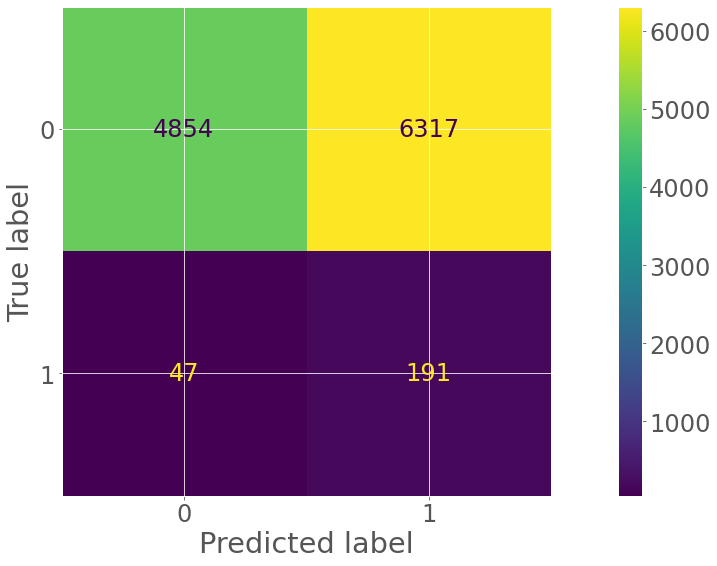

In [0]:
cm_mv = confusion_matrix(score_mevo["convertida"], score_mevo["pred"])
disp = ConfusionMatrixDisplay(cm_mv)
disp = disp.plot(include_values=True, cmap='viridis', ax=None, xticks_rotation='horizontal')

mevo_ml = ml_scores("MEVO", score_mevo["convertida"], score_mevo["pred"])
mevo_ml

In [0]:
mevo_cv = cross_validation_class(_, 5, df_cv_mevo_encodead, Verbose = True, mevo=True)
mevo_cv["Model Name"] = "MEVO"
mevo_cv

Fold Number 1/5
Fold Number 2/5
Fold Number 3/5
Fold Number 4/5
Fold Number 5/5


,Model Name,Accuracy,Balanced Accuracy,Precision,Recall,F1,Kappa
0,MEVO,0.4437 +/ - 0.0079,0.6087 +/ - 0.0132,0.0287 +/ - 0.001,0.7809 +/ - 0.028,0.0554 +/ - 0.0019,0.0157 +/ - 0.0019


/databricks/python/lib/python3.9/site-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


,Accuracy,Balanced Accuracy,Precision,Recall,F1,Kappa
lr,0.9790,0.5000,0.0000,0.0000,0.0000,0.0000


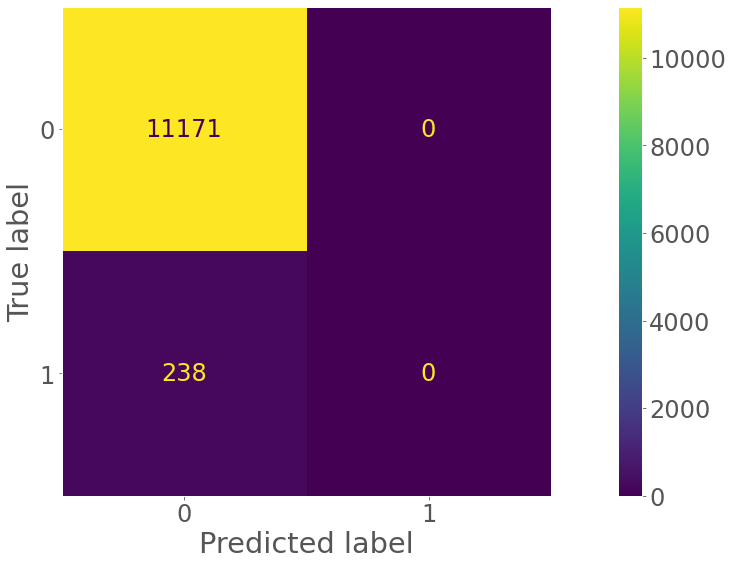

In [0]:
# LogisticRegression
lr_model = LogisticRegression( random_state=42, max_iter=5000)
lr_model.fit( X_train_encoded.drop("idprescricao", axis=1), y_train )
yhat_lr = lr_model.predict( X_test_encoded.drop("idprescricao", axis=1) )

cm = confusion_matrix( y_test.astype('int'), yhat_lr.astype('int'))
disp =ConfusionMatrixDisplay(cm)
disp = disp.plot(include_values=True, cmap='viridis', ax=None, xticks_rotation='horizontal')
plt.grid(False)

lr_results = ml_scores('lr', y_test.astype('int'), yhat_lr.astype('int'))
lr_results

In [0]:
lr_cv = cross_validation_class(lr_model, 5, df_cv_encoded, Verbose = True)
lr_cv

Fold Number 1/5
Fold Number 2/5
Fold Number 3/5
Fold Number 4/5
Fold Number 5/5


,Model Name,Accuracy,Balanced Accuracy,Precision,Recall,F1,Kappa
0,LogisticRegression,0.9791 +/ - 0.0001,0.5 +/ - 0.0,0.0 +/ - 0.0,0.0 +/ - 0.0,0.0 +/ - 0.0,0.0 +/ - 0.0


/databricks/python_shell/dbruntime/MLWorkloadsInstrumentation/_sklearn.py:29: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  original_result = original(self, *args, **kwargs)


,Accuracy,Balanced Accuracy,Precision,Recall,F1,Kappa
ExtraTreesClassifier,0.9920,0.8890,0.8120,0.7820,0.7970,0.7920


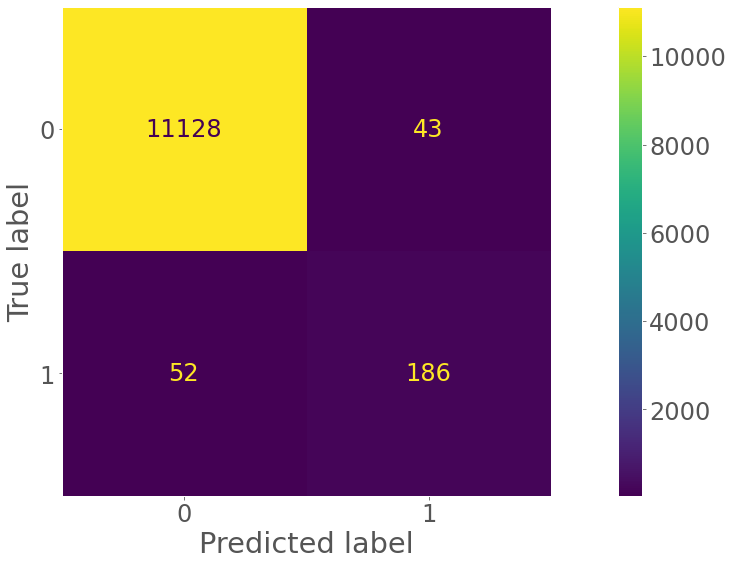

In [0]:
et = ExtraTreesClassifier(n_jobs=-1, random_state=42)
et.fit( X_train_encoded.drop("idprescricao", axis=1), y_train )
yhat_et = et.predict( X_test_encoded.drop("idprescricao", axis=1) )

cm = confusion_matrix( y_test.astype('int'), yhat_et.astype('int'))
disp =ConfusionMatrixDisplay(cm)
disp = disp.plot(include_values=True, cmap='viridis', ax=None, xticks_rotation='horizontal')
plt.grid(False)

et_results = ml_scores('ExtraTreesClassifier', y_test.astype('int'), yhat_et.astype('int'))
et_results

In [0]:
et_cv = cross_validation_class(et, 5, df_cv_encoded, Verbose = True)
et_cv

Fold Number 1/5
Fold Number 2/5
Fold Number 3/5
Fold Number 4/5
Fold Number 5/5


,Model Name,Accuracy,Balanced Accuracy,Precision,Recall,F1,Kappa
0,ExtraTreesClassifier,0.9919 +/ - 0.0009,0.883 +/ - 0.0163,0.8295 +/ - 0.0262,0.7695 +/ - 0.0325,0.798 +/ - 0.0244,0.7938 +/ - 0.0248


,Accuracy,Balanced Accuracy,Precision,Recall,F1,Kappa
XGBClassifier,0.9920,0.8910,0.8170,0.7860,0.8010,0.7970


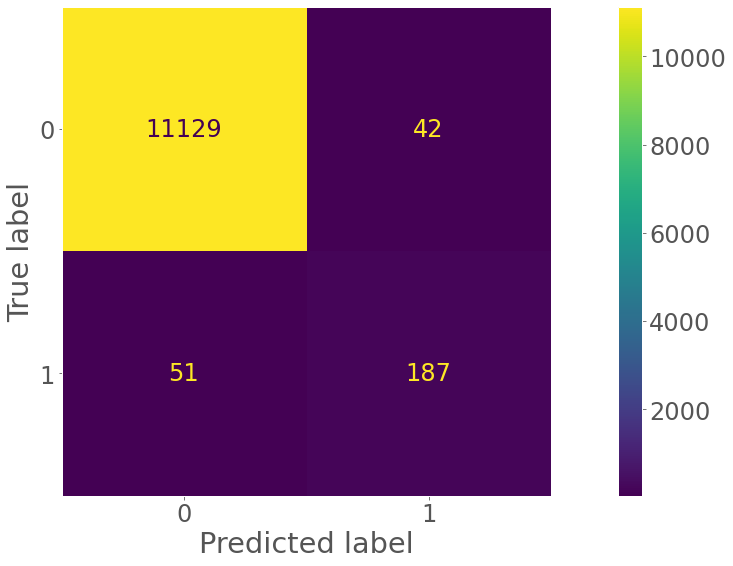

In [0]:
xgb = XGBClassifier()
xgb.fit( X_train_encoded.drop("idprescricao", axis=1), y_train )
yhat_xgb = xgb.predict( X_test_encoded.drop("idprescricao", axis=1) )

cm = confusion_matrix( y_test.astype('int'), yhat_xgb.astype('int'))
disp =ConfusionMatrixDisplay(cm)
disp = disp.plot(include_values=True, cmap='viridis', ax=None, xticks_rotation='horizontal')
plt.grid(False)

xgb_results = ml_scores('XGBClassifier', y_test.astype('int'), yhat_xgb.astype('int'))
xgb_results

In [0]:
xgb_cv = cross_validation_class(xgb, 5, df_cv_encoded, Verbose = True)
xgb_cv

Fold Number 1/5
Fold Number 2/5
Fold Number 3/5
Fold Number 4/5
Fold Number 5/5


,Model Name,Accuracy,Balanced Accuracy,Precision,Recall,F1,Kappa
0,XGBClassifier,0.9921 +/ - 0.0006,0.8961 +/ - 0.0115,0.8204 +/ - 0.0227,0.7959 +/ - 0.0232,0.8076 +/ - 0.0153,0.8036 +/ - 0.0156


In [0]:
df_score = pd.concat([mevo_ml, lr_results, et_results, xgb_results])
df_score.sort_values(by="F1", ascending=False).display()

Accuracy,Balanced Accuracy,Precision,Recall,F1,Kappa
0.992,0.891,0.817,0.786,0.801,0.797
0.992,0.889,0.812,0.782,0.797,0.792
0.442,0.619,0.029,0.803,0.057,0.017
0.979,0.5,0.0,0.0,0.0,0.0


In [0]:
df_score_cv = pd.concat([mevo_cv, lr_cv, et_cv, xgb_cv])
df_score_cv.sort_values(by="F1", ascending=False).display()

Model Name,Accuracy,Balanced Accuracy,Precision,Recall,F1,Kappa
XGBClassifier,0.9921 +/ - 0.0006,0.8961 +/ - 0.0115,0.8204 +/ - 0.0227,0.7959 +/ - 0.0232,0.8076 +/ - 0.0153,0.8036 +/ - 0.0156
ExtraTreesClassifier,0.9919 +/ - 0.0009,0.883 +/ - 0.0163,0.8295 +/ - 0.0262,0.7695 +/ - 0.0325,0.798 +/ - 0.0244,0.7938 +/ - 0.0248
MEVO,0.4437 +/ - 0.0079,0.6087 +/ - 0.0132,0.0287 +/ - 0.001,0.7809 +/ - 0.028,0.0554 +/ - 0.0019,0.0157 +/ - 0.0019
LogisticRegression,0.9791 +/ - 0.0001,0.5 +/ - 0.0,0.0 +/ - 0.0,0.0 +/ - 0.0,0.0 +/ - 0.0,0.0 +/ - 0.0
